# AAL3, patient C, measure and prediction

All the imports and installs we'll need.


In [68]:
import os
#import torch
#from torch import nn
import numpy as np
import matplotlib.pyplot as plt
#from tqdm import tqdm

from nilearn import datasets
from nilearn import plotting
from nilearn.input_data import NiftiMapsMasker
from nilearn.connectome import ConnectivityMeasure

#import torch.nn.functional as F
#from torch.nn import Sequential, Linear, ReLU, GRU, BatchNorm1d
#from torch_geometric.nn import EdgeConv, GCNConv, GraphConv
#from torch_geometric.nn import global_mean_pool
#from torch_geometric.data import InMemoryDataset, Data, DataLoader
#from torch_geometric.utils import from_networkx

import numpy as np
import matplotlib.pyplot as plt
#from tqdm import tqdm

from nilearn import datasets
from nilearn import plotting
from nilearn.input_data import NiftiMapsMasker
from nilearn.connectome import ConnectivityMeasure

#import torch.nn.functional as F
#from torch.nn import Sequential, Linear, ReLU, GRU, BatchNorm1d
#from torch_geometric.nn import EdgeConv, GCNConv, GraphConv
#from torch_geometric.nn import global_mean_pool
#from torch_geometric.data import InMemoryDataset, Data, DataLoader
#from torch_geometric.utils import from_networkx

#import networkx as nx
#from networkx.convert_matrix import from_numpy_matrix

In [69]:

# AAL3

import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, plotting, input_data
import nibabel as nib

# Path to your downloaded AAL3 atlas NIfTI file
aal3_atlas_filename = '/Users/mariamannone/Downloads/AAL3/AAL3v1.nii.gz'

# Path to your downloaded AAL3 labels file (e.g., CSV or TXT)
aal3_labels_filename = '/Users/mariamannone/Downloads/AAL3/AAL3v1.nii.txt'

# Load the labels
with open(aal3_labels_filename, 'r') as f:
    roi_names = [line.strip() for line in f]
    roi_labels = [line.strip() for line in f]
    print("roi name :", roi_names)
    #print("roi label :", roi_labels)


# Create a masker using NiftiLabelsMasker

# Just for demonstration, let's plot the atlas regions
#atlas_img = nib.load(aal3_atlas_filename)

# Plot the AAL3 atlas
#plotting.plot_roi(atlas_img, title='AAL3 Atlas')

#plt.show()


roi name : ['1 Precentral_L 1', '2 Precentral_R 2', '3 Frontal_Sup_2_L 3', '4 Frontal_Sup_2_R 4', '5 Frontal_Mid_2_L 5', '6 Frontal_Mid_2_R 6', '7 Frontal_Inf_Oper_L 7', '8 Frontal_Inf_Oper_R 8', '9 Frontal_Inf_Tri_L 9', '10 Frontal_Inf_Tri_R 10', '11 Frontal_Inf_Orb_2_L 11', '12 Frontal_Inf_Orb_2_R 12', '13 Rolandic_Oper_L 13', '14 Rolandic_Oper_R 14', '15 Supp_Motor_Area_L 15', '16 Supp_Motor_Area_R 16', '17 Olfactory_L 17', '18 Olfactory_R 18', '19 Frontal_Sup_Medial_L 19', '20 Frontal_Sup_Medial_R 20', '21 Frontal_Med_Orb_L 21', '22 Frontal_Med_Orb_R 22', '23 Rectus_L 23', '24 Rectus_R 24', '25 OFCmed_L 25', '26 OFCmed_R 26', '27 OFCant_L 27', '28 OFCant_R 28', '29 OFCpost_L 29', '30 OFCpost_R 30', '31 OFClat_L 31', '32 OFClat_R 32', '33 Insula_L 33', '34 Insula_R 34', '35 Cingulate_Ant_L', '36 Cingulate_Ant_R', '37 Cingulate_Mid_L 37', '38 Cingulate_Mid_R 38', '39 Cingulate_Post_L 39', '40 Cingulate_Post_R 40', '41 Hippocampus_L 41', '42 Hippocampus_R 42', '43 ParaHippocampal_L 43

In [70]:
import os
import numpy as np
import nibabel as nib
from nilearn import datasets, input_data, connectome
import matplotlib.pyplot as plt
import dicom2nifti
import dicom2nifti.settings as settings
import pydicom

In [212]:

# WITH the AAL3 atlas

# Define the directory containing DICOM files
dicom_folder = "/Users/mariamannone/Downloads/ADNI 5/006_S_4153/Resting_State_fMRI/2011-11-04_11_36_04.0/I264986"

# Define the output folder for NIfTI files
output_folder = "/Users/mariamannone/Desktop/new_phd_/DICOM_test"

# Create the output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# Convert DICOM to NIfTI using dicom2nifti
dicom_files = [os.path.join(dicom_folder, file) for file in os.listdir(dicom_folder) if file.endswith(".dcm")]

# Load the DICOM data
dicom_data = [pydicom.dcmread(file) for file in dicom_files]

# Convert DICOM to NIfTI
nifti_file = os.path.join(output_folder, "output.nii.gz")
dicom2nifti.convert_directory(dicom_folder, nifti_file, compression=True, reorient=True)


/Users/mariamannone/test2/lib/python3.10/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.02422980479881858656'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/test2/lib/python3.10/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08409762046509091250'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/test2/lib/python3.10/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04601643900729870359'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/test2/lib/python3.10/site-packages/pydico

In [71]:

# Define the path to the NIfTI file
nifti_file = "/Users/mariamannone/Desktop/new_phd_/DICOM_test/output.nii.gz/701_resting_state_fmri.nii.gz"

masker = input_data.NiftiLabelsMasker(labels_img=aal3_atlas_filename, standardize=True, memory='nilearn_cache')

time_series = masker.fit_transform(nifti_file)

# Compute the connectivity matrix (correlation)
correlation_measure = connectome.ConnectivityMeasure(kind='correlation')
correlation_matrices = correlation_measure.fit_transform([time_series])

# Extract the connectivity matrix
connectivity_matrix = correlation_matrices[0]



/Users/mariamannone/test2/lib/python3.10/site-packages/nilearn/maskers/nifti_labels_masker.py:805: UserWarning: After resampling the label image to the data image, the following labels were removed: {168, 170, 134, 167}. Label image only contains 163 labels (including background).
  warnings.warn(


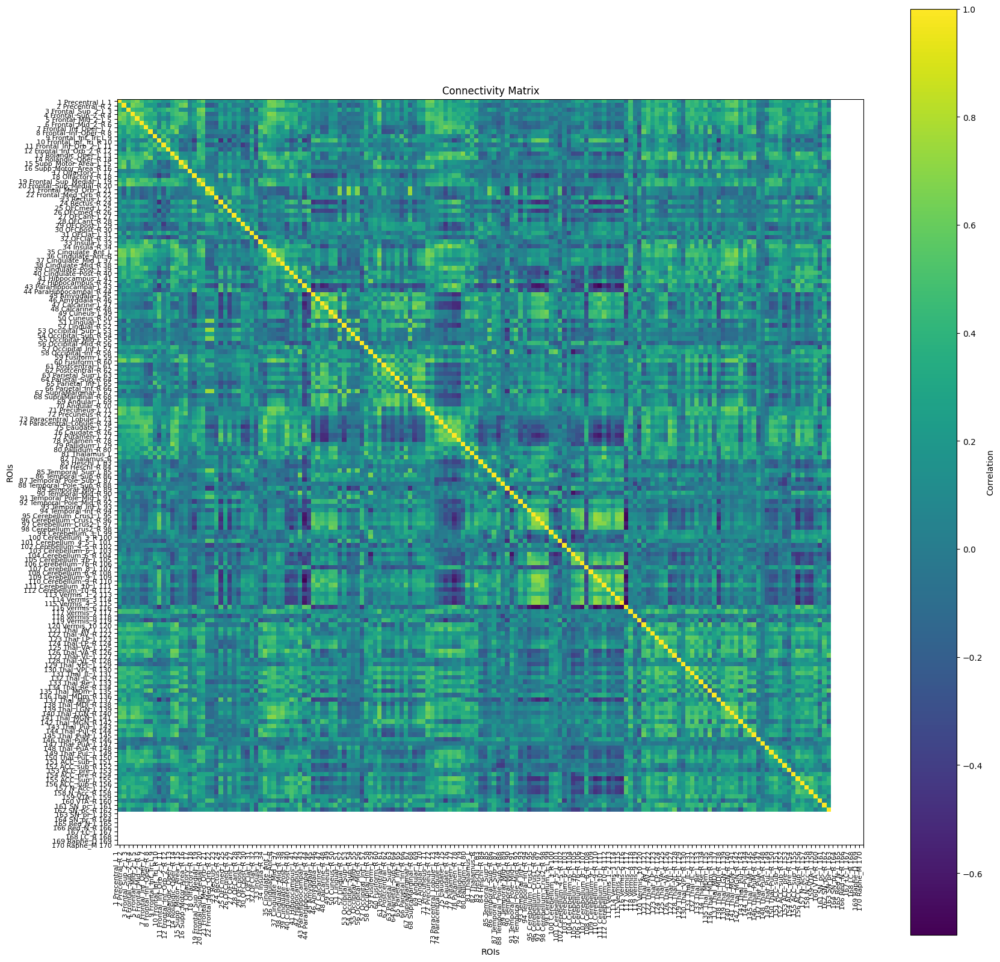

In [72]:

# Adjust the figure size to fit all labels
plt.figure(figsize=(20, 20))


plt.imshow(connectivity_matrix, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Correlation')
plt.title('Connectivity Matrix')

plt.xticks(ticks=np.arange(len(roi_names)), labels=roi_names, rotation=90, ha='right', fontsize=8)
plt.yticks(ticks=np.arange(len(roi_names)), labels=roi_names, fontsize=8)

plt.xlabel('ROIs')
plt.ylabel('ROIs')
plt.show()


In [73]:
test_BL = connectivity_matrix

In [74]:
print(test_BL)

[[ 1.          0.501615    0.46539816 ...  0.1342096   0.42400092
   0.07761782]
 [ 0.501615    1.          0.2425147  ...  0.01553481  0.25895292
  -0.08662889]
 [ 0.46539816  0.2425147   1.         ...  0.1750149   0.36870348
   0.3393507 ]
 ...
 [ 0.1342096   0.01553481  0.1750149  ...  1.          0.02000155
   0.17497976]
 [ 0.42400092  0.25895292  0.36870348 ...  0.02000155  1.
   0.262651  ]
 [ 0.07761782 -0.08662889  0.3393507  ...  0.17497976  0.262651
   1.        ]]


In [75]:
dicom_folder = "/Users/mariamannone/Downloads/ADNI 5/006_S_4153/Resting_State_fMRI/2011-11-04_11_36_04.0/I264987"

output_folder = "/Users/mariamannone/Desktop/new_phd_/DICOM_test_fu"


# Create the output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# Convert DICOM to NIfTI using dicom2nifti
dicom_files = [os.path.join(dicom_folder, file) for file in os.listdir(dicom_folder) if file.endswith(".dcm")]

# Load the DICOM data
dicom_data = [pydicom.dcmread(file) for file in dicom_files]


# Convert DICOM to NIfTI
nifti_file_fu = os.path.join(output_folder, "output.nii.gz")
dicom2nifti.convert_directory(dicom_folder, nifti_file_fu, compression=True, reorient=True)



/Users/mariamannone/test2/lib/python3.10/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.09114719342875403174'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/test2/lib/python3.10/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08409762046509091250'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/test2/lib/python3.10/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.04947252963904860923'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/test2/lib/python3.10/site-packages/pydico

In [76]:

# Define the path to the NIfTI file
nifti_file_fu = "/Users/mariamannone/Desktop/new_phd_/DICOM_test_fu/output.nii.gz/801_resting_state_fmri.nii.gz"

#fmri_img_fu = nib.load(nifti_file_fu)


# Create a masker using NiftiLabelsMasker
masker = input_data.NiftiLabelsMasker(labels_img=aal3_atlas_filename, standardize=True, memory='nilearn_cache')
time_series_fu = masker.fit_transform(nifti_file_fu)


# Compute the connectivity matrix (correlation)
correlation_measure_fu = connectome.ConnectivityMeasure(kind='correlation')
correlation_matrices_fu = correlation_measure_fu.fit_transform([time_series_fu])

# Extract the connectivity matrix
connectivity_matrix_fu = correlation_matrices_fu[0]



/Users/mariamannone/test2/lib/python3.10/site-packages/nilearn/maskers/nifti_labels_masker.py:805: UserWarning: After resampling the label image to the data image, the following labels were removed: {168, 170, 134, 167}. Label image only contains 163 labels (including background).
  warnings.warn(


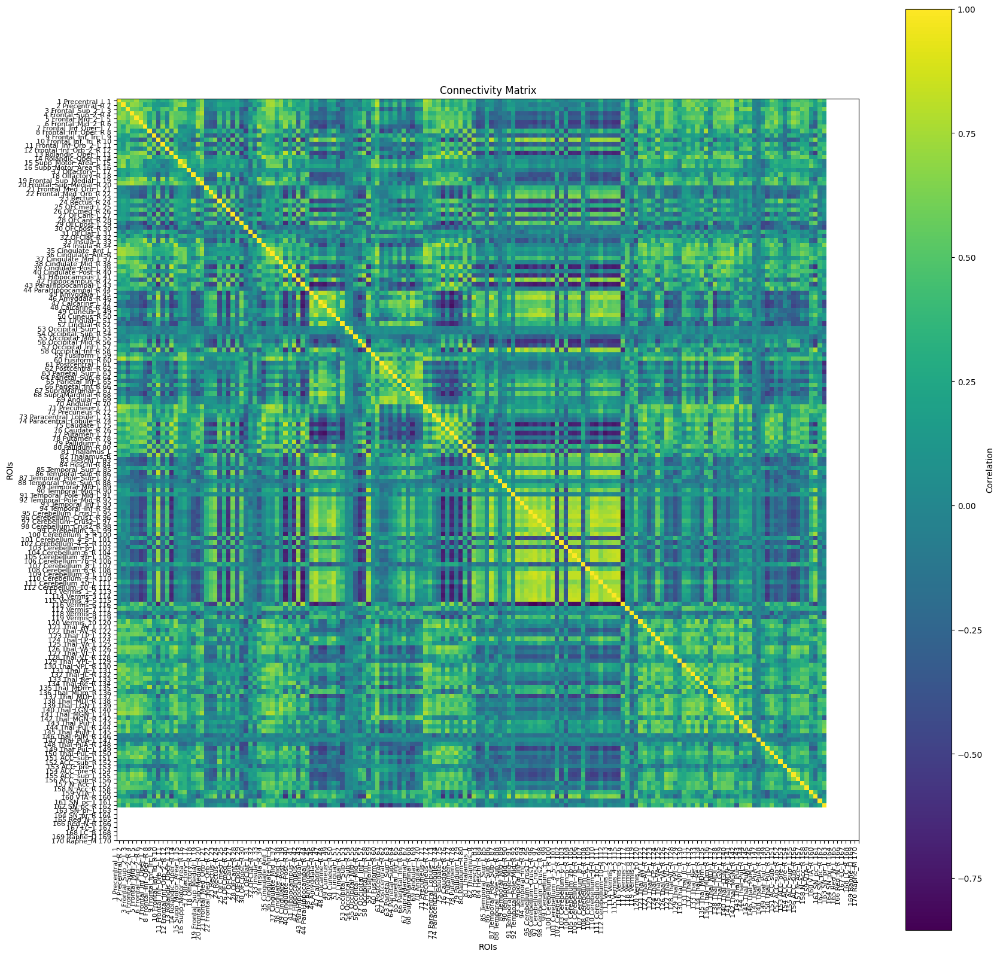

In [77]:
# Plot the connectivity matrix

# Adjust the figure size to fit all labels
plt.figure(figsize=(20, 20))


plt.imshow(connectivity_matrix_fu, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Correlation')
plt.title('Connectivity Matrix')

plt.xticks(ticks=np.arange(len(roi_names)), labels=roi_names, rotation=90, ha='right', fontsize=8)
plt.yticks(ticks=np.arange(len(roi_names)), labels=roi_names, fontsize=8)

plt.xlabel('ROIs')
plt.ylabel('ROIs')
plt.show()


In [78]:
test_FU = connectivity_matrix_fu

In [79]:
print(test_FU)

[[ 1.          0.6670874   0.6617676  ...  0.18818766  0.54958427
   0.39543387]
 [ 0.6670874   1.          0.50576526 ...  0.19060223  0.34591818
   0.15422055]
 [ 0.6617676   0.50576526  1.         ...  0.1511373   0.43067482
   0.62167704]
 ...
 [ 0.18818766  0.19060223  0.1511373  ...  1.         -0.12880108
   0.12524885]
 [ 0.54958427  0.34591818  0.43067482 ... -0.12880108  1.
   0.26259312]
 [ 0.39543387  0.15422055  0.62167704 ...  0.12524885  0.26259312
   1.        ]]


In [80]:
# for a check:

print(test_BL)

[[ 1.          0.501615    0.46539816 ...  0.1342096   0.42400092
   0.07761782]
 [ 0.501615    1.          0.2425147  ...  0.01553481  0.25895292
  -0.08662889]
 [ 0.46539816  0.2425147   1.         ...  0.1750149   0.36870348
   0.3393507 ]
 ...
 [ 0.1342096   0.01553481  0.1750149  ...  1.          0.02000155
   0.17497976]
 [ 0.42400092  0.25895292  0.36870348 ...  0.02000155  1.
   0.262651  ]
 [ 0.07761782 -0.08662889  0.3393507  ...  0.17497976  0.262651
   1.        ]]


In [81]:
size1 = test_BL.size
size2 = test_FU.size
print(size1, size2)

26244 26244


In [82]:
print("Time series length for first dataset:", len(time_series))
print("Time series length for second dataset:", len(time_series_fu))

Time series length for first dataset: 140
Time series length for second dataset: 140


In [83]:
print("Number of ROIs for first dataset:", time_series.shape[1])
print("Number of ROIs for second dataset:", time_series_fu.shape[1])


Number of ROIs for first dataset: 162
Number of ROIs for second dataset: 162


In [84]:
from nilearn import datasets
import numpy as np

# Fetch the AAL atlas to get the full list of ROI indices and labels
#aal_atlas = datasets.fetch_atlas_aal()
#roi_labels = aal_atlas.labels  # Names of all ROIs in the AAL atlas
#total_rois = list(range(len(roi_labels)))  # Indices of all ROIs in the AAL atlas

# Assume 'time_series' is your data from the first dataset
# and 'time_series_fu' is your data from the second dataset
# (you might need to adjust the names according to your actual data)

# Extract the ROI indices from the time series data
roi_indices_first = list(range(time_series.shape[1]))
roi_indices_second = list(range(time_series_fu.shape[1]))

# Find the missing ROIs in the first dataset
missing_in_first = set(roi_indices_second) - set(roi_indices_first)

# Print the ROI lists for each dataset
print("ROI indices in the first dataset:", roi_indices_first)
print("ROI indices in the second dataset:", roi_indices_second)

# Print the missing ROI indices and corresponding names
print("Missing ROI indices in the first dataset:", sorted(list(missing_in_first)))

missing_roi_labels = [roi_labels[i] for i in sorted(missing_in_first)]
print("Missing ROI labels in the first dataset:", missing_roi_labels)


ROI indices in the first dataset: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161]
ROI indices in the second dataset: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59,

In [21]:
# Remove these missing ROIs from the second dataset, and perform the computation of K

In [22]:
#from nilearn import datasets, connectome, input_data
#import numpy as np

# Define the path to the NIfTI file
#nifti_file_fu = "/Users/mariamannone/Desktop/new_phd_/DICOM_cc/output.nii.gz/801_resting_state_fmri.nii.gz"

# Load the AAL atlas
#aal_atlas = datasets.fetch_atlas_aal()
#roi_labels = aal_atlas.labels  # All ROI names

# List of ROIs to remove
#rois_to_remove = ['Vermis_9', 'Vermis_10']

# Get the indices of the ROIs to remove
#rois_to_remove_indices = [i for i, label in enumerate(roi_labels) if label in rois_to_remove]

# Create a mask to retain only the ROIs not in 'rois_to_remove_indices'
#keep_mask = [i for i in range(len(roi_labels)) if i not in rois_to_remove_indices]

# Apply the "keep mask" to filter the connectivity matrix
# Keep only the rows and columns that are in 'keep_mask'
#connectivity_matrix_filtered = connectivity_matrix_fu[keep_mask, :][:, keep_mask]

#print("Filtered Connectivity Matrix:", connectivity_matrix_filtered)

# Visualize the filtered connectivity matrix
#import matplotlib.pyplot as plt
#plt.imshow(connectivity_matrix_filtered, cmap='viridis', interpolation='nearest')
#plt.colorbar(label='Correlation')
#plt.title('Filtered Connectivity Matrix')
#plt.xlabel('ROIs')
#plt.ylabel('ROIs')
#plt.show()


/Users/mariamannone/test2/lib/python3.10/site-packages/nilearn/maskers/nifti_labels_masker.py:805: UserWarning: After resampling the label image to the data image, the following labels were removed: {168, 170, 134, 167}. Label image only contains 163 labels (including background).
  warnings.warn(


Filtered Connectivity Matrix:
 [[1.         0.50046194 0.46432832 ... 0.34069532 0.13390109 0.42302626]
 [0.50046194 1.         0.24195722 ... 0.512976   0.0154991  0.25835764]
 [0.46432832 0.24195722 1.         ... 0.21951185 0.17461258 0.36785594]
 ...
 [0.34069532 0.512976   0.21951185 ... 1.         0.29196656 0.37847874]
 [0.13390109 0.0154991  0.17461258 ... 0.29196656 1.         0.01995557]
 [0.42302626 0.25835764 0.36785594 ... 0.37847874 0.01995557 1.        ]]


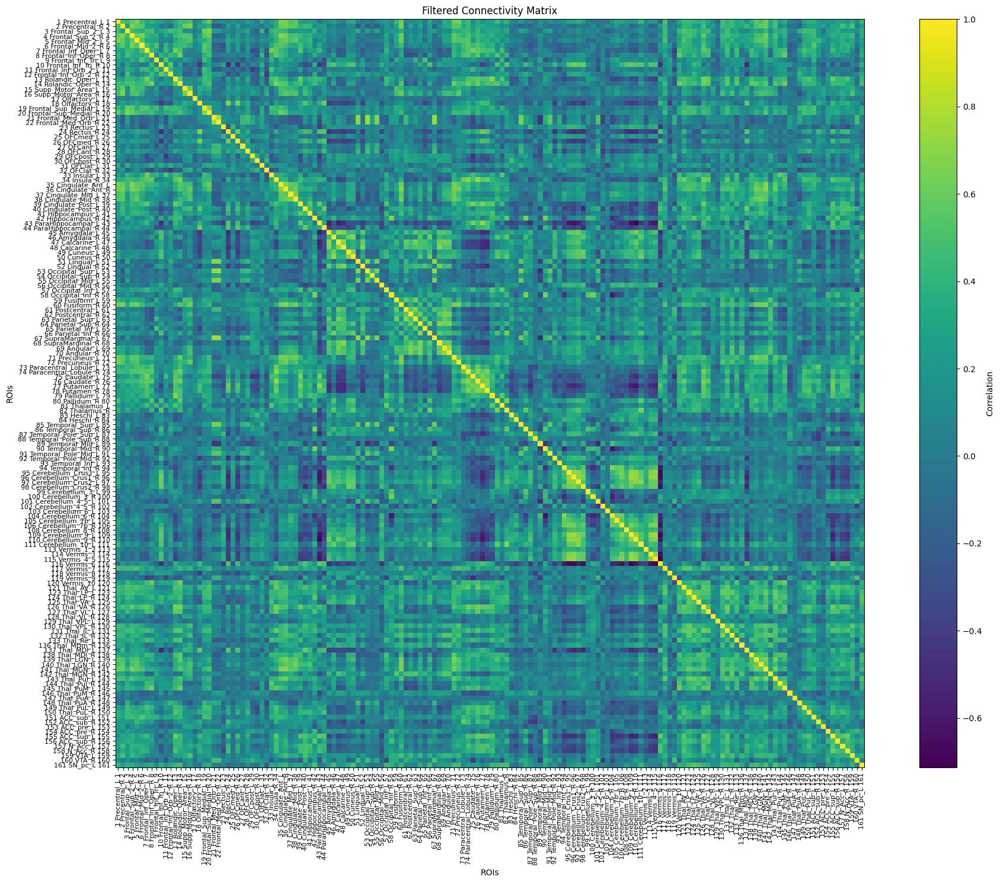

In [85]:

# Filtering out some regions according to the other analyses


from nilearn import datasets, input_data, connectome
import numpy as np
import matplotlib.pyplot as plt

# Define the path to the NIfTI file
nifti_file = "/Users/mariamannone/Desktop/new_phd_/DICOM_test/output.nii.gz/701_resting_state_fmri.nii.gz"

#nifti_file_fu = "/Users/mariamannone/Desktop/new_phd_/DICOM_test_fu/output.nii.gz/801_resting_state_fmri.nii.gz"



# List of ROIs to filter out
rois_to_filter_out = [106, 111, 121, 133, 134, 164, 167, 168, 170, 161, 162]

# Create a masker using NiftiLabelsMasker
masker = input_data.NiftiLabelsMasker(labels_img=aal3_atlas_filename, standardize=True, memory='nilearn_cache')

# Extract time series from the fMRI image using the atlas
time_series = masker.fit_transform(nifti_file)

# Identify non-empty ROIs (ROIs with non-zero time series)
non_empty_rois = np.any(time_series_fu, axis=0)
non_empty_indices = np.where(non_empty_rois)[0]

# Filter out the specified ROIs
filtered_indices = [i for i in non_empty_indices if i not in rois_to_filter_out]

# Filter the time series to include only the selected ROIs
filtered_time_series = time_series[:, filtered_indices] # JUNE 13: THE ERROR WAS HERE!!! #  time_series_fu 

# Compute the connectivity matrix
correlation_measure = connectome.ConnectivityMeasure(kind='correlation')
connectivity_matrix = correlation_measure_fu.fit_transform([filtered_time_series])[0]

# Print the filtered connectivity matrix
print("Filtered Connectivity Matrix:\n", connectivity_matrix)

# Visualize the filtered connectivity matrix
plt.figure(figsize=(20, 15))
plt.imshow(connectivity_matrix, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Correlation')
plt.title('Filtered Connectivity Matrix')
plt.xlabel('ROIs')
plt.ylabel('ROIs')
plt.xticks(ticks=np.arange(len(filtered_indices)), labels=[roi_names[i] for i in filtered_indices], rotation=90, fontsize=8)
plt.yticks(ticks=np.arange(len(filtered_indices)), labels=[roi_names[i] for i in filtered_indices], fontsize=8)
plt.tight_layout()
plt.show()

# Save the filtered connectivity matrix to a file
np.save('filtered_connectivity_matrix.npy', connectivity_matrix)

test_BL = connectivity_matrix


In [86]:
test_BL.size

24336

/Users/mariamannone/test2/lib/python3.10/site-packages/nilearn/maskers/nifti_labels_masker.py:805: UserWarning: After resampling the label image to the data image, the following labels were removed: {168, 170, 134, 167}. Label image only contains 163 labels (including background).
  warnings.warn(


Filtered Connectivity Matrix:
 [[1.         0.50046194 0.46432832 ... 0.34069532 0.13390109 0.42302626]
 [0.50046194 1.         0.24195722 ... 0.512976   0.0154991  0.25835764]
 [0.46432832 0.24195722 1.         ... 0.21951185 0.17461258 0.36785594]
 ...
 [0.34069532 0.512976   0.21951185 ... 1.         0.29196656 0.37847874]
 [0.13390109 0.0154991  0.17461258 ... 0.29196656 1.         0.01995557]
 [0.42302626 0.25835764 0.36785594 ... 0.37847874 0.01995557 1.        ]]


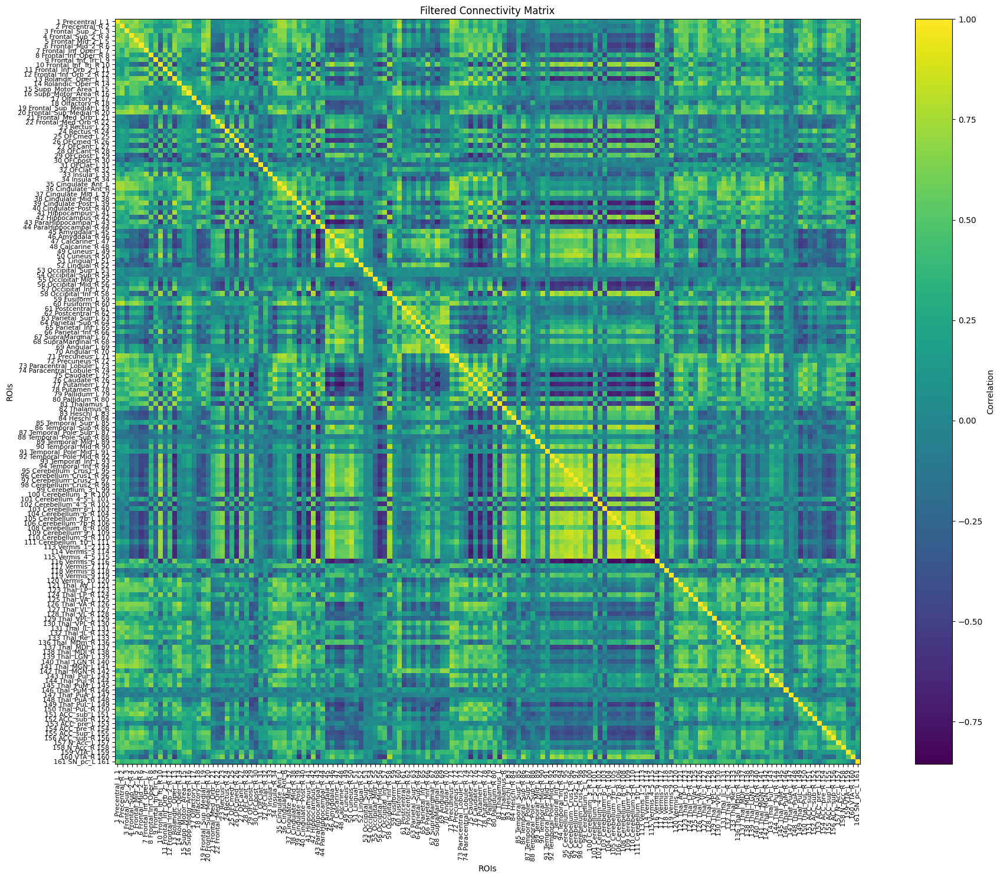

In [87]:



from nilearn import datasets, input_data, connectome
import numpy as np
import matplotlib.pyplot as plt

# Define the path to the NIfTI file
#nifti_file = "/Users/mariamannone/Desktop/new_phd_/DICOM_test/output.nii.gz/701_resting_state_fmri.nii.gz"


nifti_file_fu = "/Users/mariamannone/Desktop/new_phd_/DICOM_test_fu/output.nii.gz/801_resting_state_fmri.nii.gz"



# List of ROIs to filter out
rois_to_filter_out = [106, 111, 121, 133, 134, 164, 167, 168, 170, 161, 162]

# Create a masker using NiftiLabelsMasker
masker = input_data.NiftiLabelsMasker(labels_img=aal3_atlas_filename, standardize=True, memory='nilearn_cache')

# Extract time series from the fMRI image using the atlas
time_series_fu = masker.fit_transform(nifti_file_fu)

# Identify non-empty ROIs (ROIs with non-zero time series)
non_empty_rois = np.any(time_series_fu, axis=0)
non_empty_indices = np.where(non_empty_rois)[0]

# Filter out the specified ROIs
filtered_indices = [i for i in non_empty_indices if i not in rois_to_filter_out]

# Filter the time series to include only the selected ROIs
filtered_time_series_fu = time_series_fu[:, filtered_indices]

# Compute the connectivity matrix
correlation_measure_fu = connectome.ConnectivityMeasure(kind='correlation')
connectivity_matrix_fu = correlation_measure_fu.fit_transform([filtered_time_series_fu])[0]

# Print the filtered connectivity matrix
print("Filtered Connectivity Matrix:\n", connectivity_matrix)

# Visualize the filtered connectivity matrix
plt.figure(figsize=(20, 15))
plt.imshow(connectivity_matrix_fu, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Correlation')
plt.title('Filtered Connectivity Matrix')
plt.xlabel('ROIs')
plt.ylabel('ROIs')
plt.xticks(ticks=np.arange(len(filtered_indices)), labels=[roi_names[i] for i in filtered_indices], rotation=90, fontsize=8)
plt.yticks(ticks=np.arange(len(filtered_indices)), labels=[roi_names[i] for i in filtered_indices], fontsize=8)
plt.tight_layout()
plt.show()

# Save the filtered connectivity matrix to a file
np.save('filtered_connectivity_matrix.npy', connectivity_matrix_fu)


test_FU = connectivity_matrix_fu


In [88]:
test_FU.size

24336

In [89]:



K_ = test_FU * np.linalg.inv(test_BL)
#K_ = test_FU @ np.linalg.inv(test_BL)




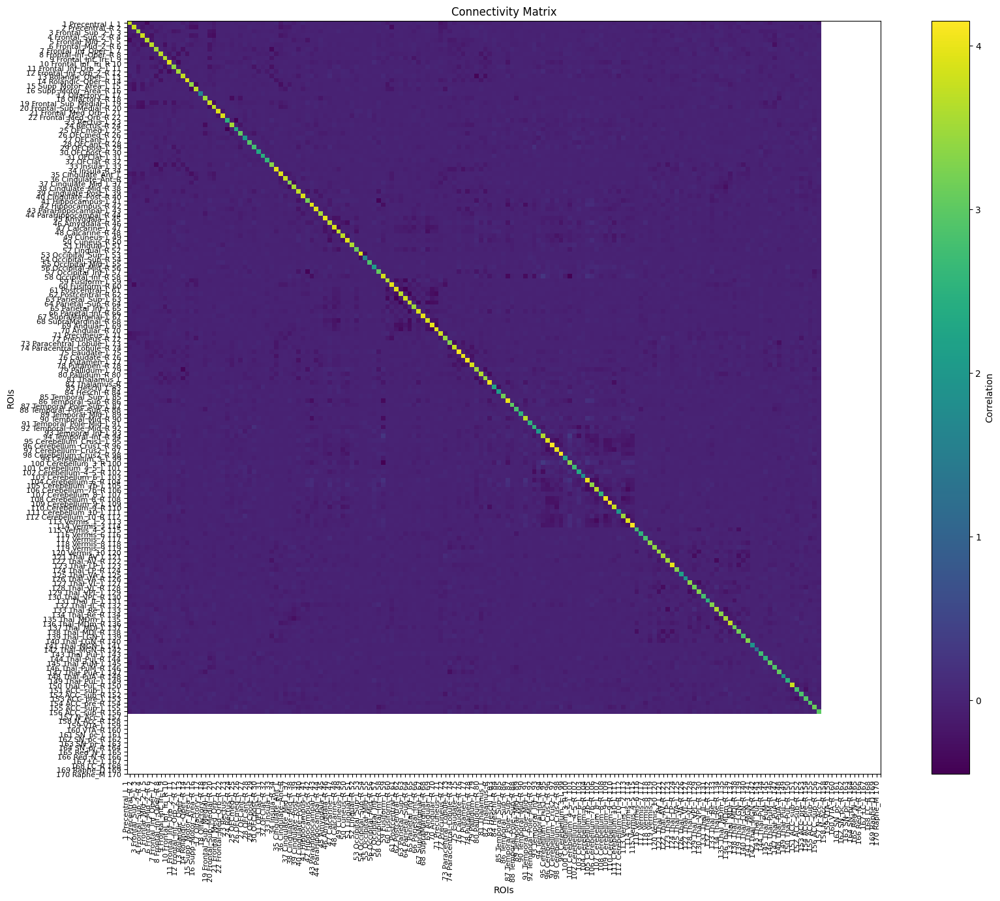

In [90]:
# Visualize K

# Fetch the AAL atlas and extract the labels



# Adjust the figure size to fit all labels
plt.figure(figsize=(20, 15))

plt.imshow(K_, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Correlation')
plt.title('Connectivity Matrix')

plt.xticks(ticks=np.arange(len(roi_names)), labels=roi_names, rotation=90, ha='right', fontsize=8)
plt.yticks(ticks=np.arange(len(roi_names)), labels=roi_names, fontsize=8)

plt.xlabel('ROIs')
plt.ylabel('ROIs')
plt.show()


In [91]:
# filtering out the smaller elements

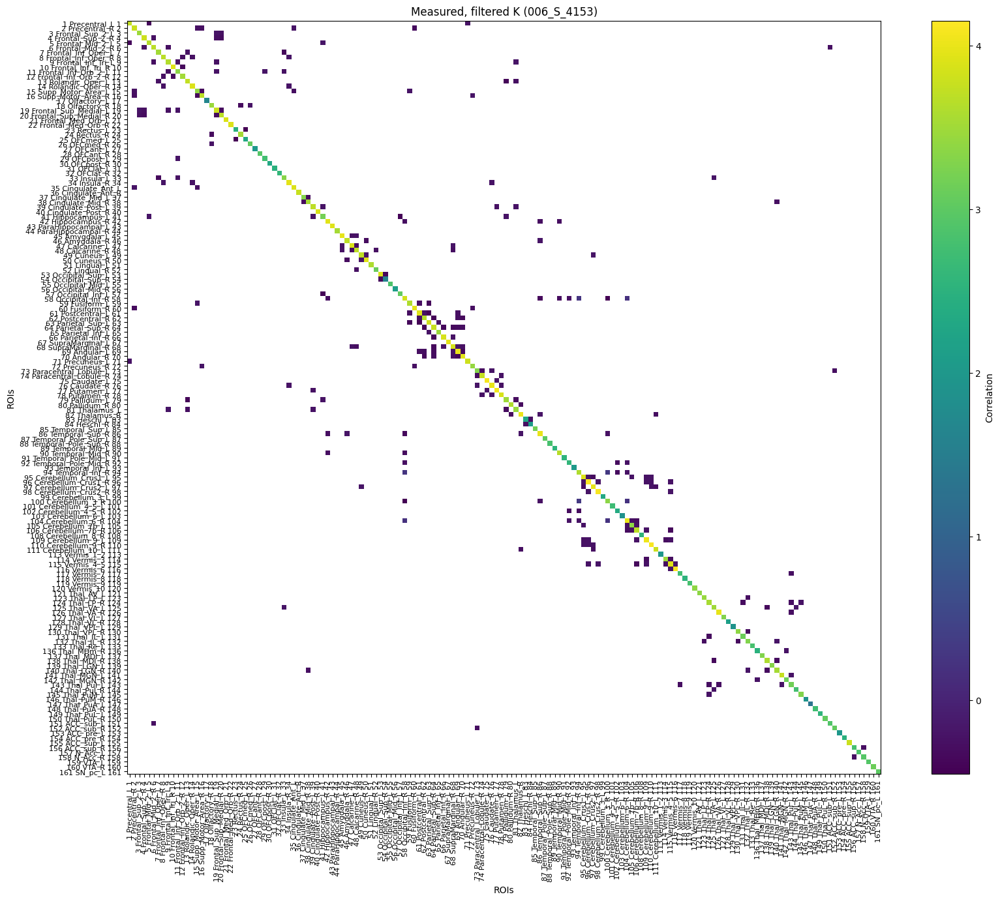

In [93]:
# Set the threshold
threshold = 0.2 # 4 is too big

#threshold = 1

#threshold = 0

# Create a boolean mask for the condition
mask = np.abs(K_) >= threshold  # True where absolute value is >= threshold

# Approach 2: Create a new matrix with only the elements >= 3, others as NaN (optional)
filtered_matrix = np.where(mask, K_, np.nan)  # Or use another value like 0

# Display the filtered matrices


# Adjust the figure size to fit all labels
plt.figure(figsize=(20, 15))

plt.imshow(filtered_matrix, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Correlation')
plt.title('Measured, filtered K (006_S_4153)')

#plt.xticks(ticks=np.arange(len(roi_names)), labels=roi_names, rotation=90, ha='right', fontsize=8)
#plt.yticks(ticks=np.arange(len(roi_names)), labels=roi_names, fontsize=8)

# they are defined above, but commented, and active for patients A and B inside the other files
plt.xticks(ticks=np.arange(len(filtered_indices)), labels=[roi_names[i] for i in filtered_indices], rotation=90, fontsize=8)
plt.yticks(ticks=np.arange(len(filtered_indices)), labels=[roi_names[i] for i in filtered_indices], fontsize=8)

plt.xlabel('ROIs')
plt.ylabel('ROIs')
#plt.savefig('K_AAL3_filtered_ADNI_006_S_4153_measured.png', dpi=300)
#plt.savefig('K_AAL3_filtered_ADNI_006_S_4153_measured_product1.png', dpi=300)


plt.savefig('K_AAL3_filtered_ADNI_006_S_4153_measured.pdf')
#plt.savefig('K_AAL3_filtered_ADNI_006_S_4153_measured_@.pdf')
#plt.savefig('K_AAL3_filtered_ADNI_006_S_4153_measured_product1.svg', format='svg')

plt.show()


In [94]:
import pickle

%store -r female_BL
%store -r female_FU

%store -r male_BL
%store -r male_FU

In [95]:
print(female_BL)

[[ 1.         -0.23155825  0.13042909 ... -0.32865357 -0.09502918
  -0.2055836 ]
 [-0.23155825  1.          0.01287384 ...  0.1101017  -0.08796066
   0.34723848]
 [ 0.13042909  0.01287384  1.         ... -0.20587458 -0.15096053
  -0.3346626 ]
 ...
 [-0.32865357  0.1101017  -0.20587458 ...  1.          0.65746
   0.61829734]
 [-0.09502918 -0.08796066 -0.15096053 ...  0.65746     1.
   0.40653053]
 [-0.2055836   0.34723848 -0.3346626  ...  0.61829734  0.40653053
   1.        ]]


In [96]:
loaded_female_BL = np.load('female_BL.npz')
female_BL = loaded_female_BL['data']

loaded_female_FU = np.load('female_Fu.npz')
female_FU = loaded_female_FU['data']

In [97]:
loaded_male_BL = np.load('male_BL.npz')
male_BL = loaded_male_BL['data']

loaded_male_FU = np.load('male_FU.npz')
male_FU = loaded_male_FU['data']

In [98]:
prova_dim1 = male_BL.size
prova_dim2 = male_FU.size
prova_dim3 = female_BL.size
prova_dim4 = female_FU.size

print(prova_dim1, prova_dim2, prova_dim3, prova_dim4)

24336 24336 24336 24336


In [99]:
# Preprocessing: filter out vermis 9, 10 from every matrix



#from nilearn import datasets, connectome, input_data
#import numpy as np

# Define the path to the NIfTI file
#nifti_file_fu = "/Users/mariamannone/Desktop/new_phd_/DICOM_bc/output.nii.gz/801_resting_state_fmri.nii.gz"

# Load the AAL atlas
#aal_atlas = datasets.fetch_atlas_aal()
#roi_labels = aal_atlas.labels  # All ROI names

# List of ROIs to remove
#rois_to_remove = ['Vermis_9', 'Vermis_10']

# Get the indices of the ROIs to remove
#rois_to_remove_indices = [i for i, label in enumerate(roi_labels) if label in rois_to_remove]

# Create a mask to retain only the ROIs not in 'rois_to_remove_indices'
#keep_mask = [i for i in range(len(roi_labels)) if i not in rois_to_remove_indices]

# Apply the "keep mask" to filter the connectivity matrix
# Keep only the rows and columns that are in 'keep_mask'
# connectivity_matrix_filtered = connectivity_matrix_fu[keep_mask, :][:, keep_mask]

#test_BL_filtered = test_BL[keep_mask, :][:, keep_mask]
#test_FU_filtered = test_FU[keep_mask, :][:, keep_mask]

#female_BL_filtered = female_BL[keep_mask, :][:, keep_mask]
#female_FU_filtered = female_FU[keep_mask, :][:, keep_mask]

#male_BL_filtered = male_BL[keep_mask, :][:, keep_mask]
#male_FU_filtered = male_FU[keep_mask, :][:, keep_mask]


# print("Filtered Connectivity Matrix:", connectivity_matrix_filtered)

# Visualize the filtered connectivity matrix
#import matplotlib.pyplot as plt
#plt.imshow(connectivity_matrix_filtered, cmap='viridis', interpolation='nearest')
#plt.colorbar(label='Correlation')
#plt.title('Filtered Connectivity Matrix')
#plt.xlabel('ROIs')
#plt.ylabel('ROIs')
#plt.show()




In [100]:
#from nilearn import datasets, input_data, connectome
#import numpy as np
#import matplotlib.pyplot as plt

# Define the path to the NIfTI file
#nifti_file = "/Users/mariamannone/Desktop/new_phd_/DICOM_test/output.nii.gz/701_resting_state_fmri.nii.gz"

# List of ROIs to keep (first 161)
#rois_to_keep_indices = list(range(160)) # 160

# Create a masker using NiftiLabelsMasker
#masker = input_data.NiftiLabelsMasker(labels_img=aal3_atlas_filename, standardize=True, memory='nilearn_cache')

# Extract time series from the fMRI image using the atlas
#time_series = masker.fit_transform(nifti_file)

# Compute the connectivity matrix
##correlation_measure = connectome.ConnectivityMeasure(kind='correlation')
#connectivity_matrix = correlation_measure.fit_transform([time_series])[0]

# Apply the "keep mask" to filter the connectivity matrix
#connectivity_matrix_filtered_BL = connectivity_matrix[rois_to_keep_indices, :][:, rois_to_keep_indices]

# Print the filtered connectivity matrix
#print("Filtered Connectivity Matrix:\n", connectivity_matrix_filtered_BL)

# Visualize the filtered connectivity matrix
#plt.figure(figsize=(10, 8))
#plt.imshow(connectivity_matrix_filtered_BL, cmap='viridis', interpolation='nearest')
#plt.colorbar(label='Correlation')
#plt.title('Filtered Connectivity Matrix')
#plt.xlabel('ROIs')
#plt.ylabel('ROIs')
#plt.xticks(ticks=np.arange(len(rois_to_keep_indices)), labels=[roi_names[i] for i in rois_to_keep_indices], rotation=90, fontsize=8)
#plt.yticks(ticks=np.arange(len(rois_to_keep_indices)), labels=[roi_names[i] for i in rois_to_keep_indices], fontsize=8)
#plt.tight_layout()
#plt.show()

# Save the filtered connectivity matrix to a file
#np.save('filtered_connectivity_matrix_BL.npy', connectivity_matrix_filtered_BL)


In [101]:
#from nilearn import datasets, input_data, connectome
#import numpy as np
#import matplotlib.pyplot as plt

# Define the path to the NIfTI file
#nifti_file_fu = "/Users/mariamannone/Desktop/new_phd_/DICOM_test_fu/output.nii.gz/801_resting_state_fmri.nii.gz"

# List of ROIs to keep (first 161)
#rois_to_keep_indices = list(range(160))

# Create a masker using NiftiLabelsMasker
#masker = input_data.NiftiLabelsMasker(labels_img=aal3_atlas_filename, standardize=True, memory='nilearn_cache')

# Extract time series from the fMRI image using the atlas
#time_series_fu = masker.fit_transform(nifti_file_fu)

# Compute the connectivity matrix
#correlation_measure_FU = connectome.ConnectivityMeasure(kind='correlation')
#connectivity_matrix_FU = correlation_measure_FU.fit_transform([time_series_fu])[0]

# Apply the "keep mask" to filter the connectivity matrix
#connectivity_matrix_filtered_FU = connectivity_matrix_FU[rois_to_keep_indices, :][:, rois_to_keep_indices]

# Print the filtered connectivity matrix
#print("Filtered Connectivity Matrix:\n", connectivity_matrix_filtered_FU)

# Visualize the filtered connectivity matrix
#plt.figure(figsize=(10, 8))
#plt.imshow(connectivity_matrix_filtered_FU, cmap='viridis', interpolation='nearest')
#plt.colorbar(label='Correlation')
#plt.title('Filtered Connectivity Matrix')
#plt.xlabel('ROIs')
#plt.ylabel('ROIs')
#plt.xticks(ticks=np.arange(len(rois_to_keep_indices)), labels=[roi_names[i] for i in rois_to_keep_indices], rotation=90, fontsize=8)
#plt.yticks(ticks=np.arange(len(rois_to_keep_indices)), labels=[roi_names[i] for i in rois_to_keep_indices], fontsize=8)
#plt.tight_layout()
#plt.show()

# Save the filtered connectivity matrix to a file
#np.save('filtered_connectivity_matrix_FU.npy', connectivity_matrix_filtered_FU)


In [102]:
trial1 = test_BL.size
trial2 = test_FU.size
print(trial1, trial2)


trial3 = test_BL.size
trial4 = test_FU.size
print(trial1, trial2)

24336 24336
24336 24336


In [103]:
#test_BL = connectivity_matrix_filtered_BL
#test_FU = connectivity_matrix_filtered_FU

In [104]:
trial1 = test_BL.size
trial2 = test_FU.size
print(trial1, trial2)


trial3 = test_BL.size
trial4 = test_FU.size
print(trial1, trial2)

24336 24336
24336 24336


In [105]:
# prediction with MLP

Epoch 1/50


/Users/mariamannone/test2/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step - loss: 0.3972
Epoch 2/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3999
Epoch 3/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3933
Epoch 4/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3852
Epoch 5/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3738
Epoch 6/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3584
Epoch 7/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3396
Epoch 8/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3177
Epoch 9/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.2914
Epoch 10/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.2602
Epoch 11/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.2250
Epoch 12/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.1868
Epoch 13/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.1470
Epoch 14/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.1084
Epoch 15/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0753
Epoch 16/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms

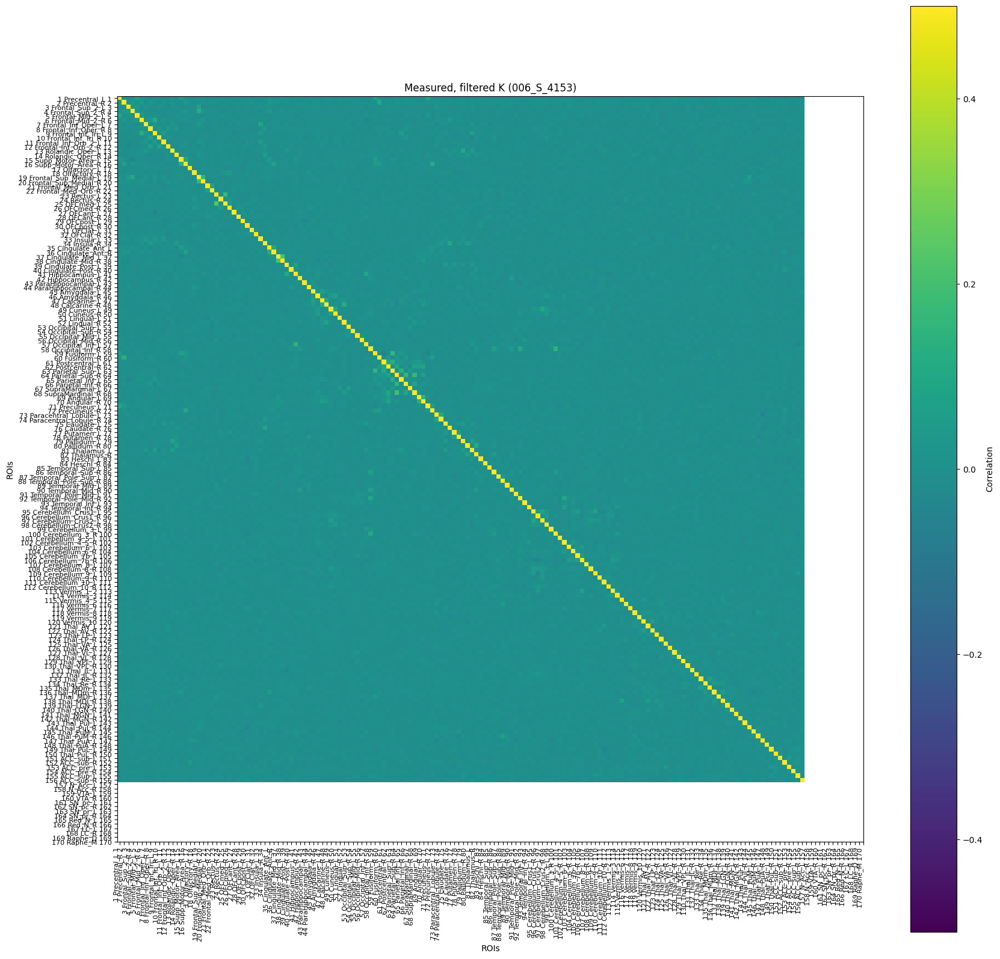

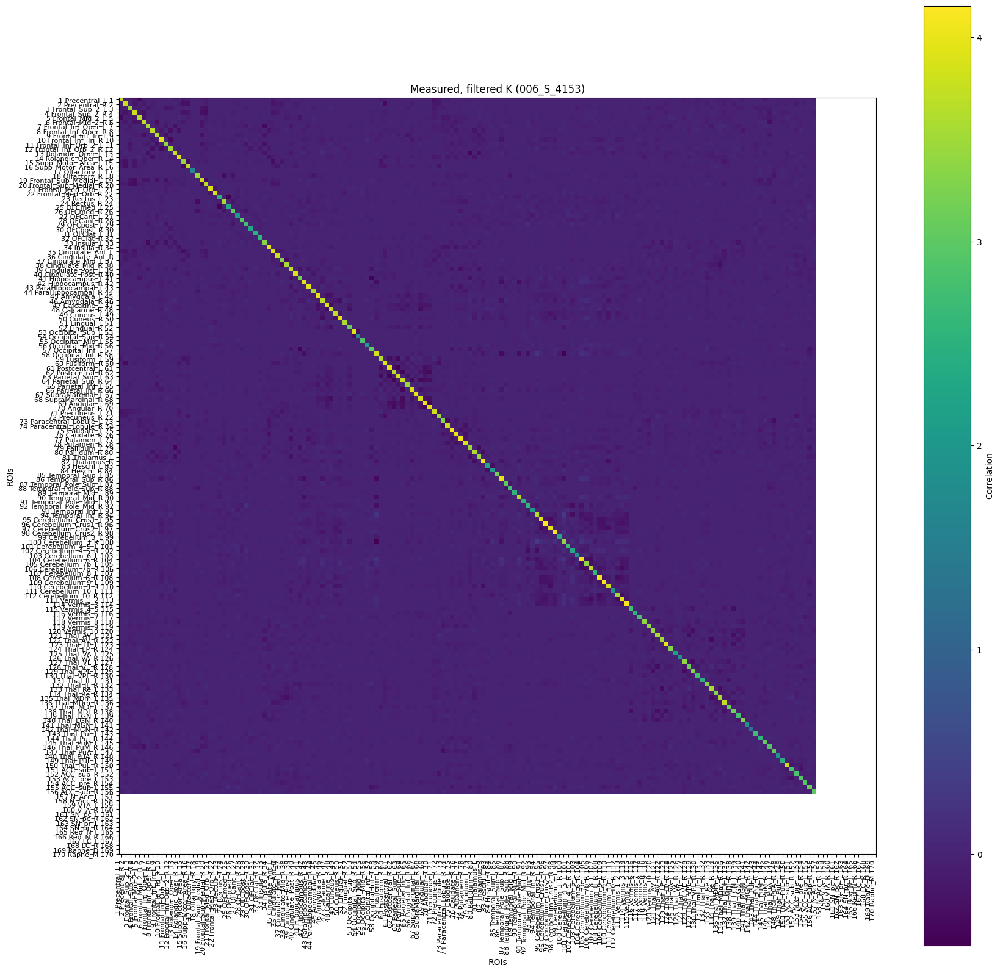

K predicted, size:  (156, 156)
K measured, size:  (156, 156)
new patient 24336
new patient FU 24336
K predicted, size:  (156, 156)
K measured, size:  (156, 156)
The predicted K-operator is not close to the real one, within tolerance 10


In [112]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from nilearn import plotting
from numpy.linalg import inv

#new_patient = test_BL_filtered
#measured_new_patient_FU = test_FU_filtered

new_patient = test_BL
measured_new_patient_FU = test_FU # add _FU

#K_1 = female_FU_filtered * np.linalg.inv(female_BL_filtered) # they are already reduced, having been removed Vermis 9 and 10
#K_2 = male_FU_filtered * np.linalg.inv(male_BL_filtered) # they are already reduced, having been removed Vermis 9 and 10




K_1 = female_FU * np.linalg.inv(female_BL)
K_2 = male_FU * np.linalg.inv(male_BL)

#K_1 = female_FU @ np.linalg.inv(female_BL)
#K_2 = male_FU @ np.linalg.inv(male_BL)



#K_measured = measured_new_patient_FU * np.linalg.inv(new_patient)


K_measured = test_FU * np.linalg.inv(test_BL)

#K_measured = test_FU @ np.linalg.inv(test_BL)


# Flatten the training data for regression
#X_train = np.vstack((female_BL_filtered.flatten(), male_BL_filtered.flatten()))  # Independent variables
X_train = np.vstack((female_BL.flatten(), male_BL.flatten()))  # Independent variables
y_train = np.array([K_1.flatten(), K_2.flatten()])  # Dependent variables (K matrices)

# Define a simple neural network model to predict estimated_new_patient_FU
model = tf.keras.Sequential([
    tf.keras.layers.Dense(64, activation='relu', input_shape=(X_train.shape[1],)),  # Input layer
    tf.keras.layers.Dense(64, activation='relu'),  # Hidden layer
    tf.keras.layers.Dense(y_train.shape[1])  # Output layer with the same dimension as y_train
])

# Compile the model with an optimizer and loss function
model.compile(optimizer='adam', loss='mse')

# Train the model
model.fit(X_train, y_train, epochs = 50)  # Adjust epochs for better results

# Now, predict the estimated_new_patient_FU given "new_patient" as input
new_patient_flat = new_patient.flatten().reshape(1, -1)  # Prepare for input
estimated_new_patient_FU = model.predict(new_patient_flat).reshape(156, 156) # (116, 116) # (160, 160)
print("estimated new patient, size of the matrix: ", estimated_new_patient_FU.shape)


# Compute K_predicted as the dot product of estimated_new_patient_FU with the inverse of new_patient
K_predicted = estimated_new_patient_FU * np.linalg.inv(new_patient)
#K_predicted = estimated_new_patient_FU @ np.linalg.inv(new_patient)


# Adjust the figure size to fit all labels
plt.figure(figsize=(20, 20))


vmin, vmax = -0.5, 0.5
plt.imshow(K_predicted, cmap='viridis', interpolation='nearest', vmin=vmin, vmax=vmax)
plt.colorbar(label='Correlation')
plt.title('Measured, filtered K (006_S_4153)')

plt.xticks(ticks=np.arange(len(roi_names)), labels=roi_names, rotation=90, ha='right', fontsize=8)
plt.yticks(ticks=np.arange(len(roi_names)), labels=roi_names, fontsize=8)

plt.xlabel('ROIs')
plt.ylabel('ROIs')
plt.savefig('predicted_K_AAL3_ADNI_006_S_4153_measured_tensor_flow.png', dpi=300)
plt.show()

# To get back to the original shapes
new_patient = new_patient.reshape(156, 156) # (116, 116) # (160, 160)
measured_new_patient_FU_filtered = measured_new_patient_FU.reshape(156, 156) # (116, 116) # (160, 160)





# Adjust the figure size to fit all labels
plt.figure(figsize=(20, 20))

plt.imshow(K_measured, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Correlation')
plt.title('Measured, filtered K (006_S_4153)')

plt.xticks(ticks=np.arange(len(roi_names)), labels=roi_names, rotation=90, ha='right', fontsize=8)
plt.yticks(ticks=np.arange(len(roi_names)), labels=roi_names, fontsize=8)

plt.xlabel('ROIs')
plt.ylabel('ROIs')
plt.show()

# To get back to the original shapes
new_patient = new_patient.reshape(156, 156) # (116, 116) # (160, 160) # (160, 160)
measured_new_patient_FU_filtered = measured_new_patient_FU.reshape(156, 156) # (116, 116) # (160, 160)




# to get back to the original shape
K_predicted = K_predicted.reshape(156, 156) # (116, 116) # (160, 160)

print("K predicted, size: ", K_predicted.shape)
print("K measured, size: ", K_measured.shape)
print("new patient", new_patient.size)
print("new patient FU", measured_new_patient_FU.size)

K_measured = measured_new_patient_FU * np.linalg.inv(new_patient)
#K_measured = measured_new_patient_FU @ np.linalg.inv(new_patient)

print("K predicted, size: ", K_predicted.shape)
print("K measured, size: ", K_measured.shape)

# Check the closeness between predicted and measured K
tolerance = 10
is_close = np.allclose(K_predicted, K_measured, atol=tolerance)

if is_close:
    print("The predicted K-operator is close to the real one, within tolerance", tolerance)
else:
    print("The predicted K-operator is not close to the real one, within tolerance", tolerance)



In [113]:
patient_C_predicted = K_predicted * new_patient

#patient_C_predicted = K_predicted @ new_patient

# then, also try the whole prediction thing with the "classic" product

In [114]:
print(patient_C_predicted)

[[ 1.1150105e+01  3.7594493e-03  4.4109553e-04 ...  5.0944340e-04
  -5.9176300e-04 -3.9074435e-03]
 [ 5.1188609e-03  1.2498890e+01  4.7305497e-04 ... -5.2256300e-03
   2.2525232e-05  7.7845278e-04]
 [ 8.9895562e-04  1.7650959e-04  9.2873354e+00 ... -1.3070383e-04
  -1.1069269e-04  9.3299767e-04]
 ...
 [-4.8438200e-05  3.0598260e-04  3.2800680e-04 ...  6.7678776e+00
   3.7488749e-03  1.6548213e-03]
 [-1.0807913e-03 -8.6968990e-05 -3.5161339e-04 ...  3.6010819e-03
   5.7728457e+00  5.1626397e-05]
 [-3.6806422e-03  5.3219590e-04 -4.9801124e-04 ...  5.3856643e-03
   2.5507791e-06  6.6248937e+00]]


In [110]:
156*156

24336

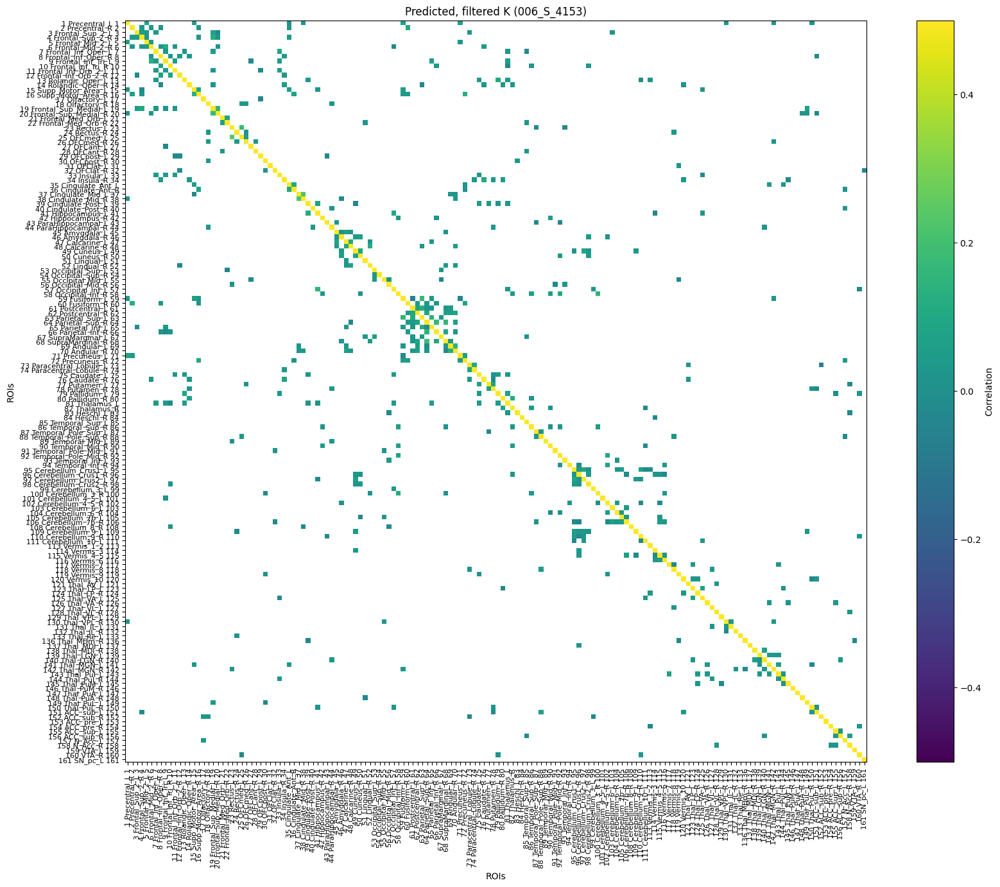

The predicted and filtered K-operator is not close to the real one, within tolerance 100


<Figure size 2000x1500 with 0 Axes>

In [116]:
# Set the threshold
threshold = 0.02 # But let me change the threshold for predicted one

#threshold = 3

# Create a boolean mask for the condition
mask1 = np.abs(K_measured) >= 0.2  # True where absolute value is >= threshold
mask2 = np.abs(K_predicted) >= threshold  # True where absolute value is >= threshold

measured_new_patient = test_FU # May 27

# Approach 2: Create a new matrix with only the elements >= 3, others as NaN (optional)
filtered_measured_K = np.where(mask1, K_measured, np.nan)  # Or use another value like 0
filtered_predicted_K = np.where(mask2, K_predicted, np.nan)  # Or use another value like 0


# Adjust the figure size to fit all labels
plt.figure(figsize=(20, 15))

vmin, vmax = -0.5, 0.5
#vmin, vmax = -2, 2
plt.imshow(filtered_predicted_K, cmap='viridis', interpolation='nearest', vmin=vmin, vmax=vmax)

plt.colorbar(label='Correlation')
plt.title('Predicted, filtered K (006_S_4153)')

plt.xticks(ticks=np.arange(len(filtered_indices)), labels=[roi_names[i] for i in filtered_indices], rotation=90, fontsize=8)
plt.yticks(ticks=np.arange(len(filtered_indices)), labels=[roi_names[i] for i in filtered_indices], fontsize=8)

#plt.xticks(ticks=np.arange(len(roi_names)), labels=roi_names, rotation=90, ha='right', fontsize=8)
#plt.yticks(ticks=np.arange(len(roi_names)), labels=roi_names, fontsize=8)

plt.xlabel('ROIs')
plt.ylabel('ROIs')
plt.savefig('predicted_K_AAL3_filtered_ADNI_006_S_4153_tensor_flow.pdf')
#plt.savefig('predicted_K_AAL3_filtered_ADNI_006_S_4153_tensor_flow_@.pdf')
plt.show()


# Adjust the figure size to fit all labels
plt.figure(figsize=(20, 15))

#plt.imshow(filtered_measured_K, cmap='viridis', interpolation='nearest')
#plt.colorbar(label='Correlation')
#plt.title('Measured, filtered K (006_S_4153)')

#plt.xticks(ticks=np.arange(len(roi_names)), labels=roi_names, rotation=90, ha='right', fontsize=8)
#plt.yticks(ticks=np.arange(len(roi_names)), labels=roi_names, fontsize=8)

#plt.xticks(ticks=np.arange(len(filtered_indices)), labels=[roi_names[i] for i in filtered_indices], rotation=90, fontsize=8)
#plt.yticks(ticks=np.arange(len(filtered_indices)), labels=[roi_names[i] for i in filtered_indices], fontsize=8)

#plt.xlabel('ROIs')
#plt.ylabel('ROIs')
#plt.savefig('measured_K_AAL3_filtered_ADNI_006_S_4153_tensor_flow.pdf')
#plt.show()


# Check the closeness between predicted and measured K
tolerance = 100
is_close = np.allclose(K_measured, filtered_predicted_K, atol=tolerance) # filtered_measured_K

if is_close:
    print("The predicted and filtered K-operator is close to the real one, within tolerance", tolerance)
else:
    print("The predicted and filtered K-operator is not close to the real one, within tolerance", tolerance)





/Users/mariamannone/test2/lib/python3.10/site-packages/nilearn/maskers/nifti_labels_masker.py:805: UserWarning: After resampling the label image to the data image, the following labels were removed: {168, 170, 134, 167}. Label image only contains 163 labels (including background).
  warnings.warn(


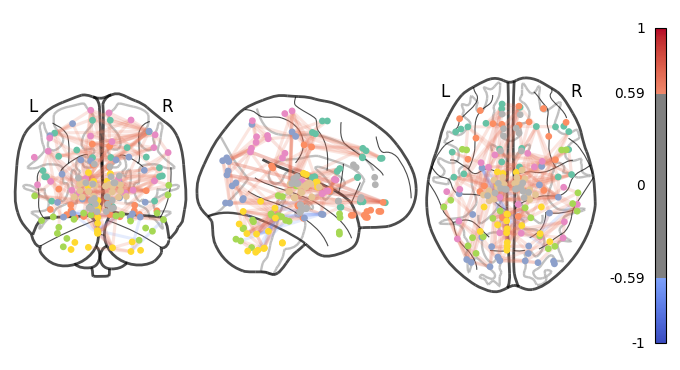

In [117]:
#

# June 12, AAL3 connectome

#

# baseline 

from nilearn import input_data, plotting, connectome
import numpy as np
import nibabel as nib
import matplotlib.pyplot as plt
import matplotlib.cm as cm

# Define the path to the NIfTI file and AAL3 atlas
nifti_file = "/Users/mariamannone/Desktop/new_phd_/DICOM_test/output.nii.gz/701_resting_state_fmri.nii.gz"
aal3_atlas_filename = '/Users/mariamannone/Downloads/AAL3/AAL3v1.nii.gz'
aal3_labels_filename = '/Users/mariamannone/Downloads/AAL3/AAL3v1.nii.txt'

# Load the AAL3 atlas image
atlas_img = nib.load(aal3_atlas_filename)

# Create a masker using the AAL3 atlas
masker = input_data.NiftiLabelsMasker(labels_img=atlas_img, standardize=True, memory='nilearn_cache')
time_series = masker.fit_transform(nifti_file)

# Identify non-empty ROIs (ROIs with non-zero time series)
non_empty_rois = np.any(time_series, axis=0)
non_empty_indices = np.where(non_empty_rois)[0]

# Filter the time series to include only non-empty ROIs
filtered_time_series = time_series[:, non_empty_indices]

# Compute the connectivity matrix
correlation_measure = connectome.ConnectivityMeasure(kind='correlation')
connectivity_matrix = correlation_measure.fit_transform([filtered_time_series])[0]

# Load the AAL3 labels
with open(aal3_labels_filename, 'r') as f:
    labels = f.read().splitlines()

# Obtain the coordinates of the ROIs from the atlas
coords = plotting.find_parcellation_cut_coords(labels_img=atlas_img)

# Filter coordinates to include only those for non-empty ROIs
filtered_coords = np.array([coords[i] for i in non_empty_indices])

# Define edge properties with transparency for edges
#edge_kwargs = {'alpha': 0.02}

# Plot the connectome
edge_properties = {
    'alpha': 0.2 # 0 is completely transparent, 1 is opaque
}

# Plot the connectome with an edge threshold of the top 80% strongest edges
# and set edge_vmin and edge_vmax directly
node_size = 15  # Adjust this value to change node size

plotting.plot_connectome(
    connectivity_matrix,
    filtered_coords,
    edge_threshold="98%",
    edge_cmap='coolwarm',  # Use a colormap for edges
    edge_vmin=-1,  # Set the minimum edge value for colormap scaling
    edge_vmax=1,  # Set the maximum edge value for colormap scaling
    edge_kwargs=edge_properties,
    colorbar=True,
    node_size=node_size
)

# Save the plot
plt.savefig('baseline_connectome_.pdf')
plt.show()


/Users/mariamannone/test2/lib/python3.10/site-packages/nilearn/maskers/nifti_labels_masker.py:805: UserWarning: After resampling the label image to the data image, the following labels were removed: {168, 170, 134, 167}. Label image only contains 163 labels (including background).
  warnings.warn(


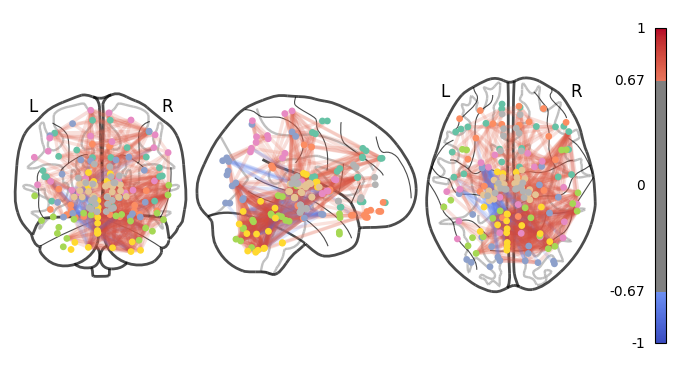

In [118]:
#

# June 12, AAL3 connectome

#

# measured follow-up

from nilearn import input_data, plotting, connectome
import numpy as np
import nibabel as nib
import matplotlib.pyplot as plt
import matplotlib.cm as cm

# Define the path to the NIfTI file and AAL3 atlas
nifti_file_fu = "/Users/mariamannone/Desktop/new_phd_/DICOM_test_fu/output.nii.gz/801_resting_state_fmri.nii.gz"
aal3_atlas_filename = '/Users/mariamannone/Downloads/AAL3/AAL3v1.nii.gz'
aal3_labels_filename = '/Users/mariamannone/Downloads/AAL3/AAL3v1.nii.txt'

# Load the AAL3 atlas image
atlas_img = nib.load(aal3_atlas_filename)

# Create a masker using the AAL3 atlas
masker = input_data.NiftiLabelsMasker(labels_img=atlas_img, standardize=True, memory='nilearn_cache')
time_series_fu = masker.fit_transform(nifti_file_fu)

# Identify non-empty ROIs (ROIs with non-zero time series)
non_empty_rois = np.any(time_series, axis=0)
non_empty_indices = np.where(non_empty_rois)[0]

# Filter the time series to include only non-empty ROIs
filtered_time_series_fu = time_series_fu[:, non_empty_indices]

# Compute the connectivity matrix
correlation_measure_fu = connectome.ConnectivityMeasure(kind='correlation')
connectivity_matrix_fu = correlation_measure_fu.fit_transform([filtered_time_series_fu])[0]

# Load the AAL3 labels
with open(aal3_labels_filename, 'r') as f:
    labels = f.read().splitlines()

# Obtain the coordinates of the ROIs from the atlas
coords = plotting.find_parcellation_cut_coords(labels_img=atlas_img)

# Filter coordinates to include only those for non-empty ROIs
filtered_coords = np.array([coords[i] for i in non_empty_indices])

# Define edge properties with transparency for edges
#edge_kwargs = {'alpha': 0.02}

# Plot the connectome
edge_properties = {
    'alpha': 0.2 # 0 is completely transparent, 1 is opaque
}

# Plot the connectome with an edge threshold of the top 80% strongest edges
# and set edge_vmin and edge_vmax directly
node_size = 15  # Adjust this value to change node size

plotting.plot_connectome(
    connectivity_matrix_fu,
    filtered_coords,
    edge_threshold="95%",
    edge_cmap='coolwarm',  # Use a colormap for edges
    edge_vmin=-1,  # Set the minimum edge value for colormap scaling
    edge_vmax=1,  # Set the maximum edge value for colormap scaling
    edge_kwargs=edge_properties,
    colorbar=True,
    node_size=node_size
)

# Save the plot
plt.savefig('fu_connectome.pdf')
plt.show()


/var/folders/tc/5k6bdv0s421bnc52mnnj7p_w0000gn/T/ipykernel_5306/2103389147.py:44: UserWarning: 'adjacency_matrix' is not symmetric. A directed graph will be plotted.
  plotting.plot_connectome(


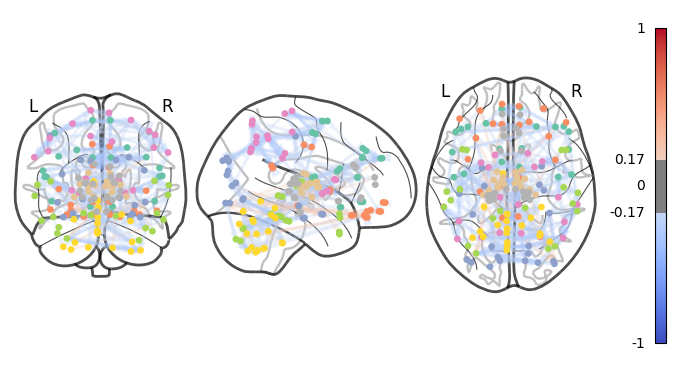

In [119]:
#

# June 12, AAL3 connectome

#

# predicted follow-up

from nilearn import input_data, plotting, connectome
import numpy as np
import nibabel as nib
import matplotlib.pyplot as plt
import matplotlib.cm as cm


predicted_connectivity_matrix = estimated_new_patient_FU

# Define the path to the NIfTI file and AAL3 atlas
#nifti_file_fu = ... no, non c'è!

# CHANGE STRATEGY! 

# Define edge properties with transparency for edges
#edge_kwargs = {'alpha': 0.02}

# Plot the connectome
edge_properties = {
    'alpha': 0.2 # 0 is completely transparent, 1 is opaque
}

# Plot the connectome with an edge threshold of the top 80% strongest edges
# and set edge_vmin and edge_vmax directly
node_size = 15  # Adjust this value to change node size


# WE SHOULD change this one:     filtered_coords
# and modify it according to the effective reduced labels of the connectivity matrix!


non_empty_indices_C = np.where(~np.all(predicted_connectivity_matrix == 0, axis=1))[0]
filtered_coords_156 = filtered_coords[non_empty_indices_C]


plotting.plot_connectome(
    predicted_connectivity_matrix,
    filtered_coords_156, # corresponding change here
    edge_threshold="98%", # change
    edge_cmap='coolwarm',  # Use a colormap for edges
    edge_vmin=-1,  # Set the minimum edge value for colormap scaling
    edge_vmax=1,  # Set the maximum edge value for colormap scaling
    edge_kwargs=edge_properties,
    colorbar=True,
    node_size=node_size
)

# Save the plot
plt.savefig('fu_predicted_connectome.pdf')
plt.show()


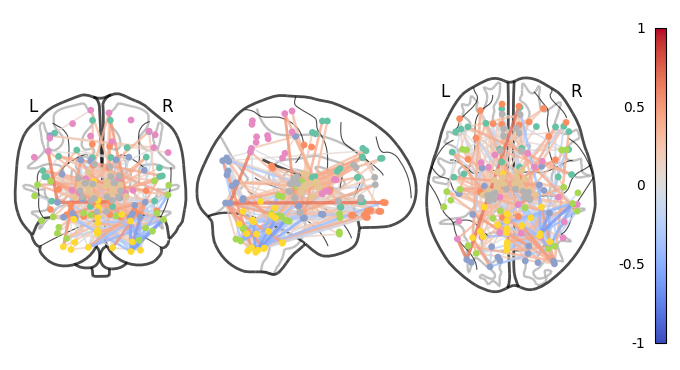

In [120]:


# JUNE 13

# identify which ROIs are above threshold in K

threshold = 0.05

rois_above_threshold = np.argwhere(K_measured > threshold) # TRIAL... K_measured, K_predicted
rois_set_ = set(rois_above_threshold.flatten())

# Store them
#roi_names_selected = [f'ROI_{i}' for i in range(162)] # filtered_coords
roi_names_selected = [f'ROI_{i}' for i in non_empty_indices]
stored_rois = {roi_names_selected[i] for i in rois_set_}

# Filter the connectivity matrix accordingly

# Create a boolean mask for filtering the connectivity matrix
mask_new = np.zeros_like(test_BL, dtype=bool) # test_BL, test_FU

for (i, j) in rois_above_threshold:
    if roi_names_selected[i] in stored_rois and roi_names_selected[j] in stored_rois:
        mask_new[i, j] = True

selection_connectivity_matrix = np.where(mask_new, test_BL, 0) # not the whole one, connectivity_matrix
filtered_coords_selected = filtered_coords[list(rois_set_)]

# visualize the connectome with this filtering:

node_size = 15  # Adjust this value to change node size

edge_properties = {
    'alpha': 0.8 # 0 is completely transparent, 1 is opaque
}

plotting.plot_connectome(
    selection_connectivity_matrix,
    filtered_coords_selected,
    edge_threshold="0%",
    edge_cmap='coolwarm',  # Use a colormap for edges
    edge_vmin=-1,  # Set the minimum edge value for colormap scaling
    edge_vmax=1,  # Set the maximum edge value for colormap scaling
    edge_kwargs=edge_properties,
    colorbar=True,
    node_size=node_size
)

# Save the plot
plt.savefig('ADNI_AAL3_baseline_connectome_selected_patient_C.pdf')
plt.show()


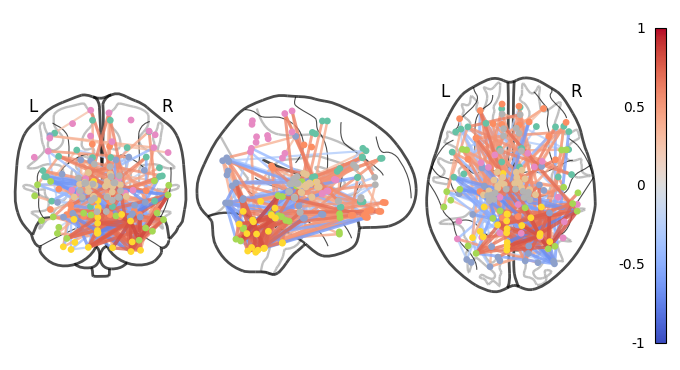

In [121]:


# JUNE 13

threshold = 0.05

# identify which ROIs are above threshold in K

rois_above_threshold = np.argwhere(K_measured > threshold) # K_measured, K_predicted
rois_set_ = set(rois_above_threshold.flatten())

# Store them
#roi_names_selected = [f'ROI_{i}' for i in range(162)] # filtered_coords
roi_names_selected = [f'ROI_{i}' for i in non_empty_indices]
stored_rois = {roi_names_selected[i] for i in rois_set_}

# Filter the connectivity matrix accordingly

# Create a boolean mask for filtering the connectivity matrix
mask_new = np.zeros_like(test_FU, dtype=bool) # estimated_new_patient_FU

for (i, j) in rois_above_threshold:
    if roi_names_selected[i] in stored_rois and roi_names_selected[j] in stored_rois:
        mask_new[i, j] = True

selection_connectivity_matrix_fu = np.where(mask_new, test_FU, 0) # not the whole one, connectivity_matrix  # estimated_new_patient_FU
filtered_coords_selected = filtered_coords[list(rois_set_)]

# visualize the connectome with this filtering:

node_size = 15  # Adjust this value to change node size

edge_properties = {
    'alpha': 0.8 # 0 is completely transparent, 1 is opaque
}

plotting.plot_connectome(
    selection_connectivity_matrix_fu,
    filtered_coords_selected,
    edge_threshold="0%",
    edge_cmap='coolwarm',  # Use a colormap for edges
    edge_vmin=-1,  # Set the minimum edge value for colormap scaling
    edge_vmax=1,  # Set the maximum edge value for colormap scaling
    edge_kwargs=edge_properties,
    colorbar=True,
    node_size=node_size
)

# Save the plot
plt.savefig('ADNI_AAL3_fu_connectome_selected_patient_C_measured.pdf')
plt.show()


In [122]:
print(test_BL)

[[1.         0.50046194 0.46432832 ... 0.34069532 0.13390109 0.42302626]
 [0.50046194 1.         0.24195722 ... 0.512976   0.0154991  0.25835764]
 [0.46432832 0.24195722 1.         ... 0.21951185 0.17461258 0.36785594]
 ...
 [0.34069532 0.512976   0.21951185 ... 1.         0.29196656 0.37847874]
 [0.13390109 0.0154991  0.17461258 ... 0.29196656 1.         0.01995557]
 [0.42302626 0.25835764 0.36785594 ... 0.37847874 0.01995557 1.        ]]


In [123]:
print(test_FU)

[[ 1.          0.6672121   0.6618914  ...  0.3265252   0.18822284
   0.549687  ]
 [ 0.6672121   1.          0.50585985 ...  0.46366793  0.19063787
   0.34598285]
 [ 0.6618914   0.50585985  1.         ...  0.10202057  0.15116556
   0.43075535]
 ...
 [ 0.3265252   0.46366793  0.10202057 ...  1.          0.4977989
   0.11386419]
 [ 0.18822284  0.19063787  0.15116556 ...  0.4977989   1.
  -0.12882517]
 [ 0.549687    0.34598285  0.43075535 ...  0.11386419 -0.12882517
   1.        ]]


/var/folders/tc/5k6bdv0s421bnc52mnnj7p_w0000gn/T/ipykernel_5306/3006447603.py:35: UserWarning: 'adjacency_matrix' is not symmetric. A directed graph will be plotted.
  plotting.plot_connectome(


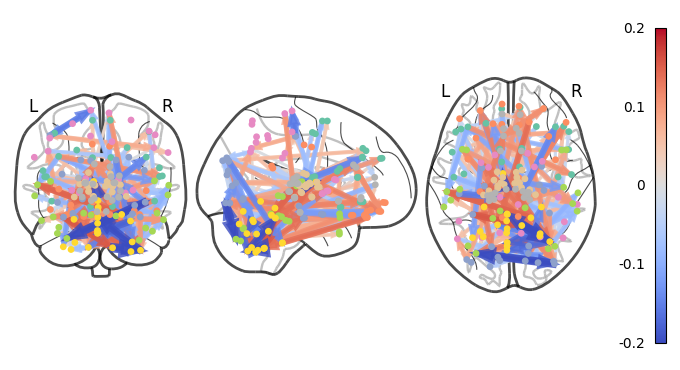

In [127]:


# JUNE 13

threshold = 0.05

# identify which ROIs are above threshold in K

rois_above_threshold = np.argwhere(K_measured > threshold) # K_measured, K_predicted
rois_set_ = set(rois_above_threshold.flatten())

# Store them
#roi_names_selected = [f'ROI_{i}' for i in range(162)] # filtered_coords
roi_names_selected = [f'ROI_{i}' for i in non_empty_indices]
stored_rois = {roi_names_selected[i] for i in rois_set_}

# Filter the connectivity matrix accordingly

# Create a boolean mask for filtering the connectivity matrix
mask_new = np.zeros_like(estimated_new_patient_FU, dtype=bool) # estimated_new_patient_FU

for (i, j) in rois_above_threshold:
    if roi_names_selected[i] in stored_rois and roi_names_selected[j] in stored_rois:
        mask_new[i, j] = True

selection_connectivity_matrix_fu = np.where(mask_new, estimated_new_patient_FU, 0) # not the whole one, connectivity_matrix
filtered_coords_selected = filtered_coords[list(rois_set_)]

# visualize the connectome with this filtering:

node_size = 15  # Adjust this value to change node size

edge_properties = {
    'alpha': 0.8 # 0 is completely transparent, 1 is opaque
}

plotting.plot_connectome(
    selection_connectivity_matrix_fu,
    filtered_coords_selected,
    edge_threshold="0%",
    edge_cmap='coolwarm',  # Use a colormap for edges
    #edge_vmin=-1,  # Set the minimum edge value for colormap scaling
    #edge_vmax=1,  # Set the maximum edge value for colormap scaling
    edge_vmin=-0.2,  # Set the minimum edge value for colormap scaling
    edge_vmax=0.2,
    edge_kwargs=edge_properties,
    colorbar=True,
    node_size=node_size
)

# Save the plot
plt.savefig('ADNI_AAL3_fu_connectome_selected_patient_C_predicted.pdf')
#plt.savefig('ADNI_AAL3_fu_connectome_selected_patient_C_predicted_@.pdf')
plt.show()


/var/folders/tc/5k6bdv0s421bnc52mnnj7p_w0000gn/T/ipykernel_5306/1179332273.py:40: UserWarning: 'adjacency_matrix' is not symmetric. A directed graph will be plotted.
  plotting.plot_connectome(


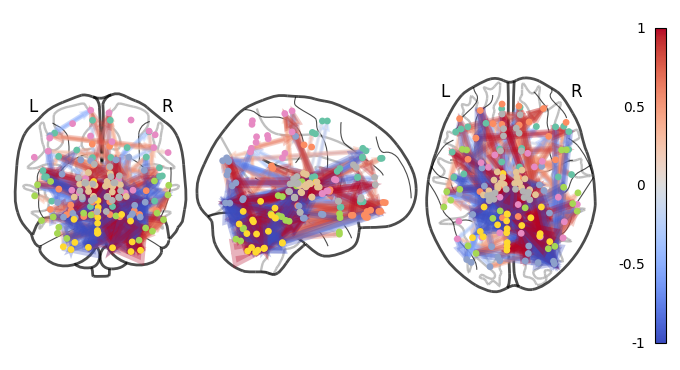

In [64]:


# JUNE 13

threshold = 0.05


# To compute this: change the previous * product to @



# identify which ROIs are above threshold in K

rois_above_threshold = np.argwhere(K_measured > threshold) # K_measured, K_predicted
rois_set_ = set(rois_above_threshold.flatten())

# Store them
#roi_names_selected = [f'ROI_{i}' for i in range(162)] # filtered_coords
roi_names_selected = [f'ROI_{i}' for i in non_empty_indices]
stored_rois = {roi_names_selected[i] for i in rois_set_}

# Filter the connectivity matrix accordingly

# Create a boolean mask for filtering the connectivity matrix
mask_new = np.zeros_like(estimated_new_patient_FU, dtype=bool) # estimated_new_patient_FU

for (i, j) in rois_above_threshold:
    if roi_names_selected[i] in stored_rois and roi_names_selected[j] in stored_rois:
        mask_new[i, j] = True

selection_connectivity_matrix_fu = np.where(mask_new, estimated_new_patient_FU, 0) # not the whole one, connectivity_matrix
filtered_coords_selected = filtered_coords[list(rois_set_)]

# visualize the connectome with this filtering:

node_size = 15  # Adjust this value to change node size

edge_properties = {
    'alpha': 0.3 # 0 is completely transparent, 1 is opaque
}

plotting.plot_connectome(
    selection_connectivity_matrix_fu,
    filtered_coords_selected,
    edge_threshold="0%",
    edge_cmap='coolwarm',  # Use a colormap for edges
    edge_vmin=-1,  # Set the minimum edge value for colormap scaling
    edge_vmax=1,  # Set the maximum edge value for colormap scaling
    edge_kwargs=edge_properties,
    colorbar=True,
    node_size=node_size
)

# Save the plot
plt.savefig('ADNI_AAL3_fu_connectome_selected_patient_C_predicted.pdf')
#plt.savefig('ADNI_AAL3_fu_connectome_selected_patient_C_predicted_@.pdf')
plt.show()


In [263]:
# still with AAL


from nilearn import datasets

# Fetch the AAL atlas
aal = datasets.fetch_atlas_aal()

# Extract the labels from the AAL atlas
atlas_labels = aal.labels

# List of ROIs to find indices for
roi_names_selection = [
    "Occipital_Mid_R", "Occipital_Inf_L", "Occipital_Inf_R", "Fusiform_L", "Postcentral_R", 
    "Supramarginal_R", "Cerebelum_Crus1_R", "Cerebelum_3_L", "Cerebelum_4_5_R", "Cerebelum_8_L",
    "Cerebelum_9_R", "Cerebelum_10_L", "Cerebelum_10_R", "Vermis_6", "Vermis_7", "Vermis_8", 
    "Cingulum_Post_R", "Frontal_Inf_Tri_R", "Precentral_R", "Frontal_Sup_L", "Heschl_L", 
    "Pallidum_L", "Parietal_Inf_L", "Occipital_Mid_L", "Hippocampus_L", "Hippocampus_R",
    "ParaHippocampal_L", "Temporal_Mid_L", "Temporal_Mid_R", "ParaHippocampal_R"
]

# Get the indices for the specified ROI names
roi_indices_selection = [i for i, label in enumerate(atlas_labels) if label in roi_names_selection]

print("Indices for the specified ROIs:", roi_indices_selection)


Indices for the specified ROIs: [1, 2, 13, 35, 36, 37, 38, 39, 50, 51, 52, 53, 54, 57, 60, 74, 78, 84, 85, 91, 94, 97, 102, 105, 106, 107, 111, 112, 113]


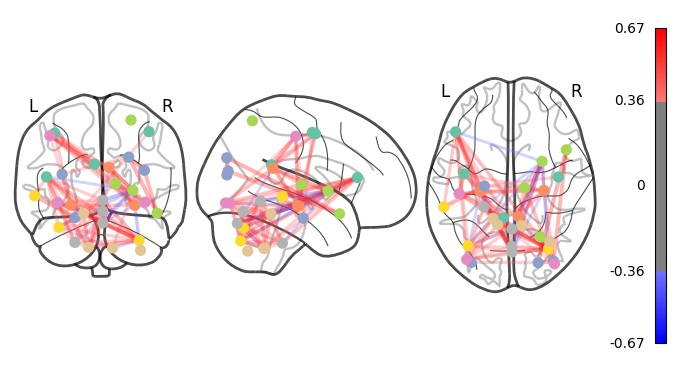

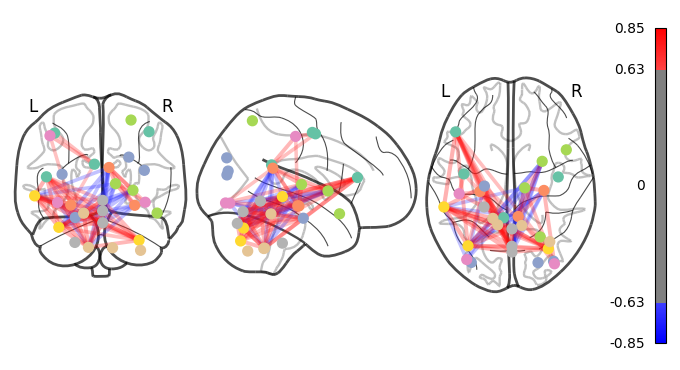

/var/folders/tc/5k6bdv0s421bnc52mnnj7p_w0000gn/T/ipykernel_13729/858211002.py:54: UserWarning: 'adjacency_matrix' is not symmetric. A directed graph will be plotted.
  plotting.plot_connectome(connectivity_matrix_fu_partial_predicted, selected_coords, edge_threshold="80%", edge_kwargs=edge_properties, colorbar=True)


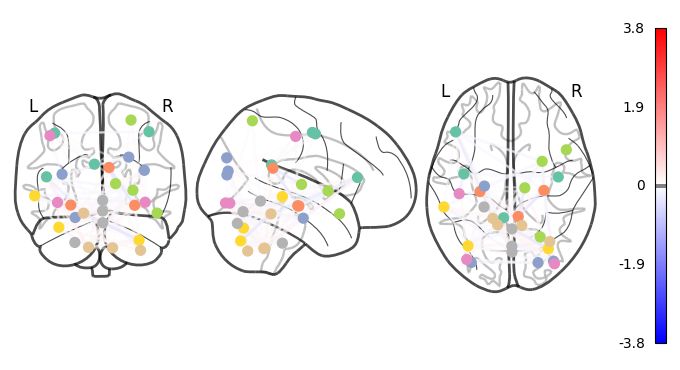

In [31]:
import numpy as np
from nilearn import datasets, plotting, input_data, connectome
import nibabel as nib

# Fetch the AAL atlas
aal_atlas = datasets.fetch_atlas_aal()

# Get the map and labels from the AAL atlas
atlas_filename = aal_atlas['maps']
atlas_labels = aal_atlas['labels']

# Load the NIfTI image to access coordinates
atlas_img = nib.load(atlas_filename)

# The coordinates for each ROI are obtained from the affine transformation
# and the indices where the atlas has a specific ROI value
unique_roi_values = np.unique(atlas_img.get_fdata())
roi_coords = []

# Find the center of each ROI in the atlas
for roi_value in unique_roi_values:
    if roi_value != 0:  # Skip background (value 0)
        roi_indices = np.argwhere(atlas_img.get_fdata() == roi_value)
        roi_center = np.mean(roi_indices, axis=0)  # Compute the mean position
        roi_coords.append(nib.affines.apply_affine(atlas_img.affine, roi_center))

# Now you have the coordinates for each ROI
roi_indices = [1, 2, 13, 35, 36, 37, 38, 39, 50, 51, 52, 53, 54, 57, 60, 74, 78, 84, 85, 91, 94, 97, 102, 105, 106, 107, 111, 112, 113]

# Extract only the coordinates that correspond to your selection
selected_coords = [roi_coords[i - 1] for i in roi_indices]

# Example: Filter a connectivity matrix to these indices
# Assuming you have a connectivity matrix
# connectivity_matrix = np.random.rand(116, 116)  # Replace with your matrix
connectivity_matrix_partial = connectivity_matrix[np.ix_(roi_indices, roi_indices)]
connectivity_matrix_fu_partial = connectivity_matrix_fu[np.ix_(roi_indices, roi_indices)]
connectivity_matrix_fu_partial_predicted = estimated_new_patient_FU[np.ix_(roi_indices, roi_indices)]


edge_properties = {
    'alpha': 0.3 # 0 is completely transparent, 1 is opaque
}

# Plot the filtered connectome with the selected coordinates
plotting.plot_connectome(connectivity_matrix_partial, selected_coords, edge_threshold="80%", edge_kwargs=edge_properties, colorbar=True)
plt.savefig('baseline_partial_connectome_ADNI_006_S_4153.png', dpi=300)
plotting.show()

plotting.plot_connectome(connectivity_matrix_fu_partial, selected_coords, edge_threshold="80%", edge_kwargs=edge_properties, colorbar=True)
plt.savefig('fu_partial_connectome_ADNI_006_S_4153.png', dpi=300)
plotting.show()

plotting.plot_connectome(connectivity_matrix_fu_partial_predicted, selected_coords, edge_threshold="80%", edge_kwargs=edge_properties, colorbar=True)
plt.savefig('estimated_fu_partial_connectome_ADNI_006_S_4153.png', dpi=300)
plotting.show()
